==========================================

Nama : Evan Juanto

Batch : BSD-006

==========================================

# 1. introduction

## 1.1 Latar Belakang

Karena variasi ras anjing yang sangat besar dalam penampilan anjing dari berbagai ras. Setiap ras memiliki karakteristik fisik yang unik, seperti bentuk tubuh, warna bulu, ukuran, dan pola, yang membuat tugas klasifikasi menjadi kompleks.

## 1.2 Problem Statement

Penggunaan CNN untuk klasifikasi jenis anjing bertujuan untuk mengembangkan model yang mampu mengenali dan mengklasifikasikan berbagai jenis anjing. Model ini diharapkan dapat membantu dalam berbagai aplikasi, termasuk adopsi hewan peliharaan, manajemen data hewan, dan bahkan penelitian genetik.

# 2. Import Libraries

In [1]:
pip install split-folders

In [11]:
import splitfolders
import os
import glob
import random
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,classification_report,ConfusionMatrixDisplay,confusion_matrix
import warnings


# 3. Data Loading

Mengambil data dari [link](https://www.kaggle.com/datasets/khushikhushikhushi/dog-breed-image-dataset/data), loading data menggunakan kaggle API

In [3]:
# memilih file kaggle.json
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"evanjuanto","key":"1ba3756fbe91a2ad09d0ce184b8f2da2"}'}

In [4]:
! mkdir ~/.kaggle

In [5]:
!cp kaggle.json ~/.kaggle/

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
# download dataset
! kaggle datasets download -d khushikhushikhushi/dog-breed-image-dataset

Dataset URL: https://www.kaggle.com/datasets/khushikhushikhushi/dog-breed-image-dataset
License(s): MIT
  0% 0.00/3.98M [00:00<?, ?B/s]
100% 3.98M/3.98M [00:00<00:00, 120MB/s]


In [8]:
# unzip dataset
! unzip dog-breed-image-dataset.zip

Archive:  dog-breed-image-dataset.zip
  inflating: dataset/Beagle/Beagle_1.jpg  
  inflating: dataset/Beagle/Beagle_10.jpg  
  inflating: dataset/Beagle/Beagle_100.jpg  
  inflating: dataset/Beagle/Beagle_11.jpg  
  inflating: dataset/Beagle/Beagle_12.jpg  
  inflating: dataset/Beagle/Beagle_13.jpg  
  inflating: dataset/Beagle/Beagle_14.jpg  
  inflating: dataset/Beagle/Beagle_15.jpg  
  inflating: dataset/Beagle/Beagle_16.jpg  
  inflating: dataset/Beagle/Beagle_17.jpg  
  inflating: dataset/Beagle/Beagle_18.jpg  
  inflating: dataset/Beagle/Beagle_19.jpg  
  inflating: dataset/Beagle/Beagle_2.jpg  
  inflating: dataset/Beagle/Beagle_20.jpg  
  inflating: dataset/Beagle/Beagle_21.jpg  
  inflating: dataset/Beagle/Beagle_22.jpg  
  inflating: dataset/Beagle/Beagle_23.jpg  
  inflating: dataset/Beagle/Beagle_24.jpg  
  inflating: dataset/Beagle/Beagle_25.jpg  
  inflating: dataset/Beagle/Beagle_26.jpg  
  inflating: dataset/Beagle/Beagle_27.jpg  
  inflating: dataset/Beagle/Beagle_28.j

Mengenal ada folder apa saja yang ada di file yang sudah saya download tadi

In [9]:
path = "/content/dataset"
print(os.listdir(path))

['Labrador_Retriever', 'Dachshund', 'Golden_Retriever', 'Bulldog', 'Beagle', 'Yorkshire_Terrier', 'Boxer', 'Poodle', 'Rottweiler', 'German_Shepherd']


Ada 'Rottweiler', 'Yorkshire_Terrier', 'Labrador_Retriever', 'Dachshund', 'German_Shepherd', 'Bulldog', 'Golden_Retriever', 'Poodle', 'Beagle', 'Boxer' didalam isi foldernya.

Saya akan membagi isi folder menjadi train set, test set, dan validation set menggunakan library split-folder

In [12]:
#split folder menjadi train-set, test-set, dan validation-set
splitfolders.ratio(path,seed=1337,output="Val",ratio=(0.7, 0.15,0.15))

Copying files: 967 files [00:00, 2741.20 files/s]


Membuat variabel untuk direktori train-set, test-set, dan validation-set

In [13]:
main_path = "/content/Val"

# Membuat variabel untuk direktori train, test, dan val
train_dir = os.path.join(main_path, 'train')
test_dir = os.path.join(main_path, 'test')
val_dir = os.path.join(main_path, 'val')

# Mencetak jalur direktori
print("Train Directory:", train_dir)
print("Test Directory:", test_dir)
print("Validation Directory:", val_dir)

Train Directory: /content/Val/train
Test Directory: /content/Val/test
Validation Directory: /content/Val/val


 di atas adalah  direktori yang digunakan untuk menyimpan data test-set, train-set, dan validation-set

 saya akan membuat variabel yang menyimpan jumlah gambar dalam setiap kelas (ras anjing) pada set train-set, test-set, dan validation-set

In [14]:
# Fungsi untuk menghitung jumlah file dalam direktori
def count_files(directory, classes):
    counts = {}
    for class_name in classes:
        class_dir = os.path.join(directory, class_name)
        counts[class_name] = len(os.listdir(class_dir))
    return counts

# Daftar kelas anjing
classes = [
    'Beagle', 'Boxer', 'Bulldog', 'Dachshund', 'German_Shepherd',
    'Golden_Retriever', 'Labrador_Retriever', 'Poodle',
    'Rottweiler', 'Yorkshire_Terrier'
]

# Menghitung jumlah gambar dalam setiap kelas untuk train, test, dan val
train_counts = count_files(train_dir, classes)
test_counts = count_files(test_dir, classes)
val_counts = count_files(val_dir, classes)

# Mencetak hasil
print('Train Dataset')
for class_name, count in train_counts.items():
    print(f'Count of train_{class_name.replace(" ", "_")} : {count}')

print('----------------')
print('Test Dataset')
for class_name, count in test_counts.items():
    print(f'Count of test_{class_name.replace(" ", "_")} : {count}')

print('----------------')
print('Validation Dataset')
for class_name, count in val_counts.items():
    print(f'Count of val_{class_name.replace(" ", "_")} : {count}')


Train Dataset
Count of train_Beagle : 70
Count of train_Boxer : 70
Count of train_Bulldog : 70
Count of train_Dachshund : 67
Count of train_German_Shepherd : 67
Count of train_Golden_Retriever : 63
Count of train_Labrador_Retriever : 66
Count of train_Poodle : 70
Count of train_Rottweiler : 62
Count of train_Yorkshire_Terrier : 70
----------------
Test Dataset
Count of test_Beagle : 15
Count of test_Boxer : 15
Count of test_Bulldog : 15
Count of test_Dachshund : 15
Count of test_German_Shepherd : 15
Count of test_Golden_Retriever : 15
Count of test_Labrador_Retriever : 15
Count of test_Poodle : 15
Count of test_Rottweiler : 14
Count of test_Yorkshire_Terrier : 15
----------------
Validation Dataset
Count of val_Beagle : 15
Count of val_Boxer : 15
Count of val_Bulldog : 15
Count of val_Dachshund : 14
Count of val_German_Shepherd : 14
Count of val_Golden_Retriever : 13
Count of val_Labrador_Retriever : 14
Count of val_Poodle : 15
Count of val_Rottweiler : 13
Count of val_Yorkshire_Terrie

In [17]:
# Buat variabel

#train-set

train_beagle = glob.glob(train_dir + '/Beagle/*.jpg')
train_boxer = glob.glob(train_dir + '/Boxer/*.jpg')
train_bulldog = glob.glob(train_dir + '/Bulldog/*.jpg')
train_dachshund = glob.glob(train_dir + '/Dachshund/*.jpg')
train_german = glob.glob(train_dir + '/German_Shepherd/*.jpg')
train_golden = glob.glob(train_dir + '/Golden_Retriever/*.jpg')
train_labrador = glob.glob(train_dir + '/Labrador_Retriever/*.jpg')
train_poodle = glob.glob(train_dir + '/Poodle/*.jpg')
train_rottweiler = glob.glob(train_dir + '/Rottweiler/*.jpg')
train_yorkshire = glob.glob(train_dir + '/Yorkshire_Terrier/*.jpg')

#test-set

test_beagle = glob.glob(test_dir + '/Beagle/*.jpg')
test_boxer = glob.glob(test_dir + '/Boxer/*.jpg')
test_bulldog = glob.glob(test_dir + '/Bulldog/*.jpg')
test_dachshund = glob.glob(test_dir + '/Dachshund/*.jpg')
test_german = glob.glob(test_dir + '/German_Shepherd/*.jpg')
test_golden = glob.glob(test_dir + '/Golden_Retriever/*.jpg')
test_labrador = glob.glob(test_dir + '/Labrador_Retriever/*.jpg')
test_poodle = glob.glob(test_dir + '/Poodle/*.jpg')
test_rottweiler = glob.glob(test_dir + '/Rottweiler/*.jpg')
test_yorkshire = glob.glob(test_dir + '/Yorkshire_Terrier/*.jpg')

#validation-set

val_beagle = glob.glob(val_dir + '/Beagle/*.jpg')
val_boxer = glob.glob(val_dir + '/Boxer/*.jpg')
val_bulldog = glob.glob(val_dir + '/Bulldog/*.jpg')
val_dachshund = glob.glob(val_dir + '/Dachshund/*.jpg')
val_german = glob.glob(val_dir + '/German_Shepherd/*.jpg')
val_golden = glob.glob(val_dir + '/Golden_Retriever/*.jpg')
val_labrador = glob.glob(val_dir + '/Labrador_Retriever/*.jpg')
val_poodle = glob.glob(val_dir + '/Poodle/*.jpg')
val_rottweiler = glob.glob(val_dir + '/Rottweiler/*.jpg')
val_yorkshire = glob.glob(val_dir + '/Yorkshire_Terrier/*.jpg')

In [18]:
# Membuat dataframe train-set, test-set, validation-set

def create_dataframe(list_of_images):
  data=[]
  for image in list_of_images:
    data.append((image, image.split('/')[-2]))

  return pd.DataFrame(data, columns= ['images', 'label'])

train_df = create_dataframe(train_beagle + train_boxer + train_bulldog + train_dachshund + train_german + train_golden + train_labrador
                            + train_poodle + train_rottweiler + train_yorkshire)
train_df = train_df.sample(frac=1, random_state=7).reset_index(drop=True)

test_df = create_dataframe(test_beagle + test_boxer + test_bulldog + test_dachshund + test_german + test_golden + test_labrador
                            + test_poodle + test_rottweiler + test_yorkshire)
test_df = test_df.sample(frac=1, random_state=7).reset_index(drop=True)

val_df = create_dataframe(val_beagle + val_boxer + val_bulldog + val_dachshund + val_german + val_golden + val_labrador
                            + val_poodle + val_rottweiler + val_yorkshire)
val_df = val_df.sample(frac=1, random_state=7).reset_index(drop=True)


In [19]:
train_df

,images,label
0,/content/Val/train/Dachshund/Dachshund_70.jpg,Dachshund
1,/content/Val/train/Golden_Retriever/Golden Ret...,Golden_Retriever
2,/content/Val/train/Labrador_Retriever/Labrador...,Labrador_Retriever
3,/content/Val/train/Bulldog/Bulldog_36.jpg,Bulldog
4,/content/Val/train/Labrador_Retriever/Labrador...,Labrador_Retriever
...,...,...
670,/content/Val/train/Rottweiler/Rottweiler_15.jpg,Rottweiler
671,/content/Val/train/Poodle/Poodle_24.jpg,Poodle
672,/content/Val/train/Poodle/Poodle_27.jpg,Poodle
673,/content/Val/train/Bulldog/Bulldog_42.jpg,Bulldog


In [15]:
# split to inference dataset

# test_df, inf_df = train_test_split(test_df, test_size=0.02, random_state=7)
# print(test_df)
# print(inf_df)

                                               images               label
70  /content/Val/test/Golden_Retriever/Golden Retr...    Golden_Retriever
90     /content/Val/test/Rottweiler/Rottweiler_85.jpg          Rottweiler
81             /content/Val/test/Poodle/Poodle_28.jpg              Poodle
58     /content/Val/test/Rottweiler/Rottweiler_49.jpg          Rottweiler
26  /content/Val/test/Yorkshire_Terrier/Yorkshire ...   Yorkshire_Terrier
..                                                ...                 ...
83  /content/Val/test/German_Shepherd/German Sheph...     German_Shepherd
67       /content/Val/test/Dachshund/Dachshund_93.jpg           Dachshund
25             /content/Val/test/Beagle/Beagle_70.jpg              Beagle
68  /content/Val/test/Labrador_Retriever/Labrador ...  Labrador_Retriever
47             /content/Val/test/Poodle/Poodle_47.jpg              Poodle

[99 rows x 2 columns]
                                               images            label
22             /co

# 4. EDA

Di bagian EDA, saya akan melihat perbedaan karakteristik fisik yang unik, seperti bentuk tubuh, warna bulu, ukuran, dan pola. Di setiap kelas ras anjing

In [21]:
#fungsi untuk memvisualisasikan setiap kelas

def visualize_samples_by_label(df, label, num_samples=20):
    samples = df[df['label'] == label]['images'].iloc[:num_samples].tolist()
    num_cols = min(num_samples, 5)
    num_rows = (num_samples - 1) // num_cols + 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 2 * num_rows))
    count = 0
    for i in range(num_rows):
        for j in range(num_cols):
            if count < len(samples):
                sample = samples[count]
                img = cv2.imread(sample)
                ax = axes[i, j]
                ax.set_title(sample.split('/')[-1])
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                ax.axis('off')
                count += 1
    plt.tight_layout()
    plt.show()

###  4.1 Beagle

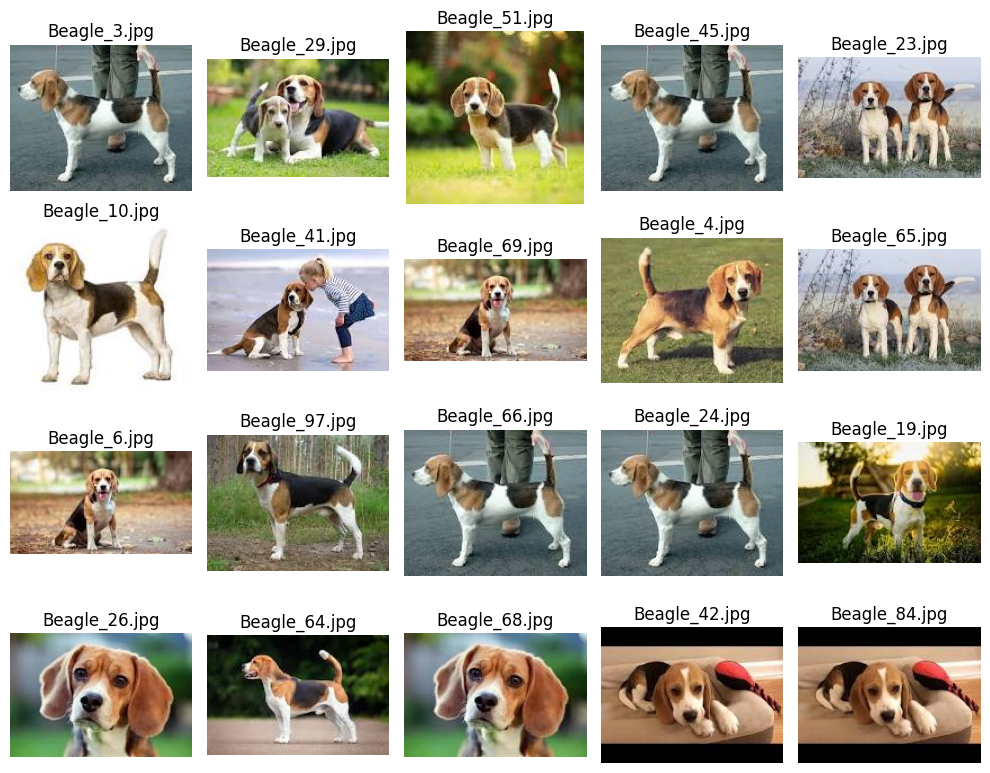

In [22]:
# Visualisasi beagle
visualize_samples_by_label(train_df, 'Beagle', num_samples=20)

Karakteristik Beagle :
- Memiliki bulu pendek yang biasanya berwarna tricolor (hitam, putih, dan cokelat).
- Telinga mereka panjang dan turun.

### 4.2 Boxer

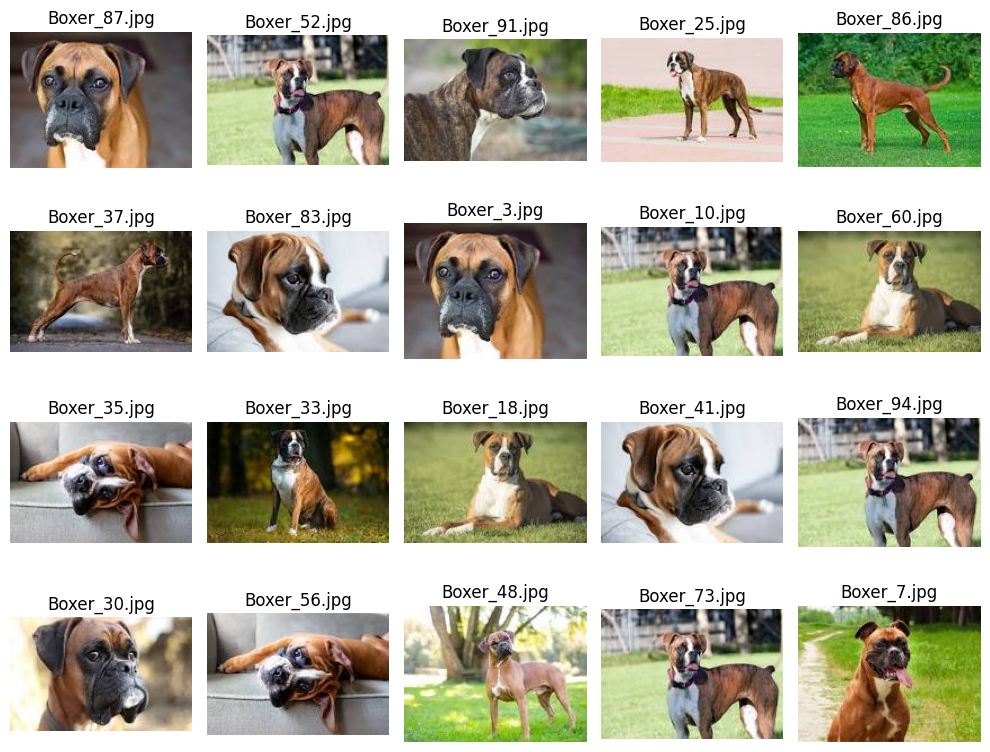

In [23]:
visualize_samples_by_label(train_df, 'Boxer', num_samples=20)

Karakteristik Boxer :    
- Bulu mereka pendek, biasanya berwarna cokelat dengan tanda putih.
- Boxer memiliki tubuh yang kekar dan berotot dengan ukuran sedang hingga besar.

### 4.3 Bulldog

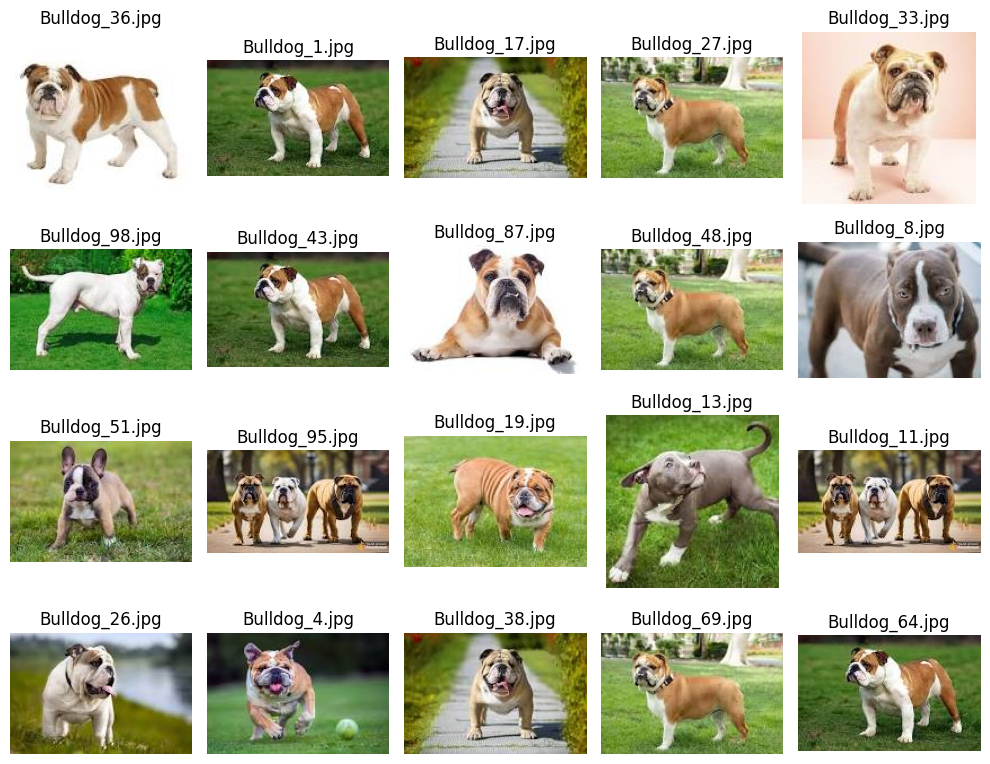

In [24]:
visualize_samples_by_label(train_df, 'Bulldog', num_samples=20)

Karakteristik Bulldog :    
- Bulldog memiliki tubuh yang kekar dan berotot, dengan dada yang lebar dan kaki yang pendek.
- Bulldog memiliki bulu yang pendek, dengan berbagai warna seperti putih, coklat, dan hitam.

## 4.4 Dachshund

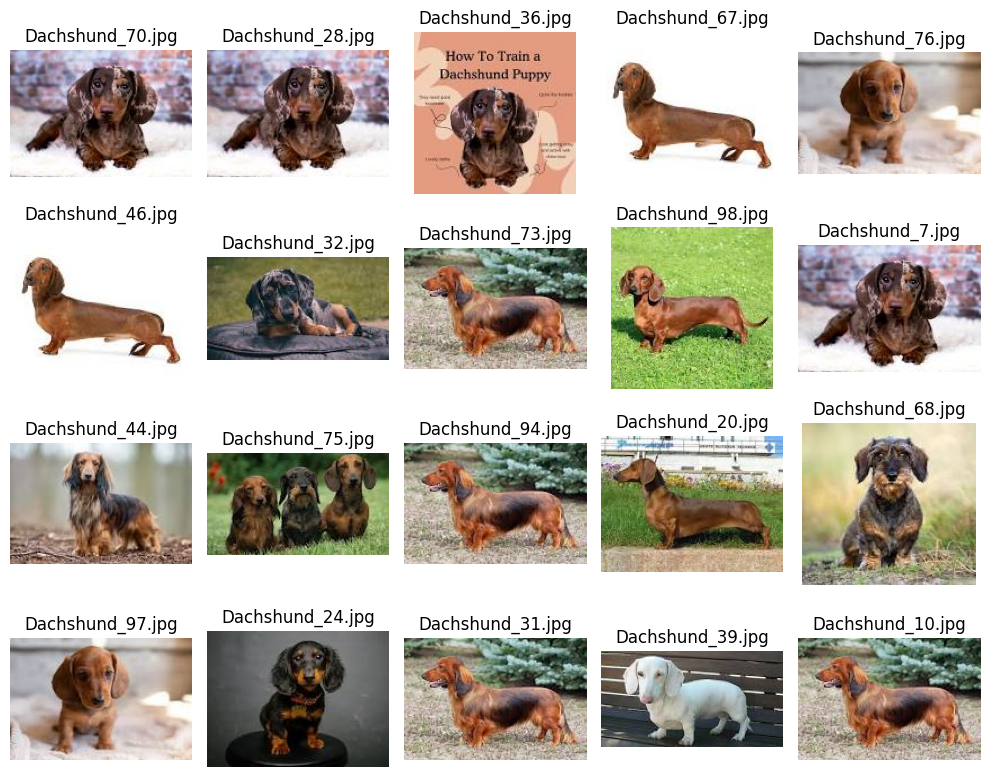

In [25]:
visualize_samples_by_label(train_df, 'Dachshund', num_samples=20)

Karakteristik Dachshund :    
- Panjang dan ramping dengan kaki pendek.
- berbagai variasi warna, hitam, coklat, dan putih

### 4.5 German Shepherd

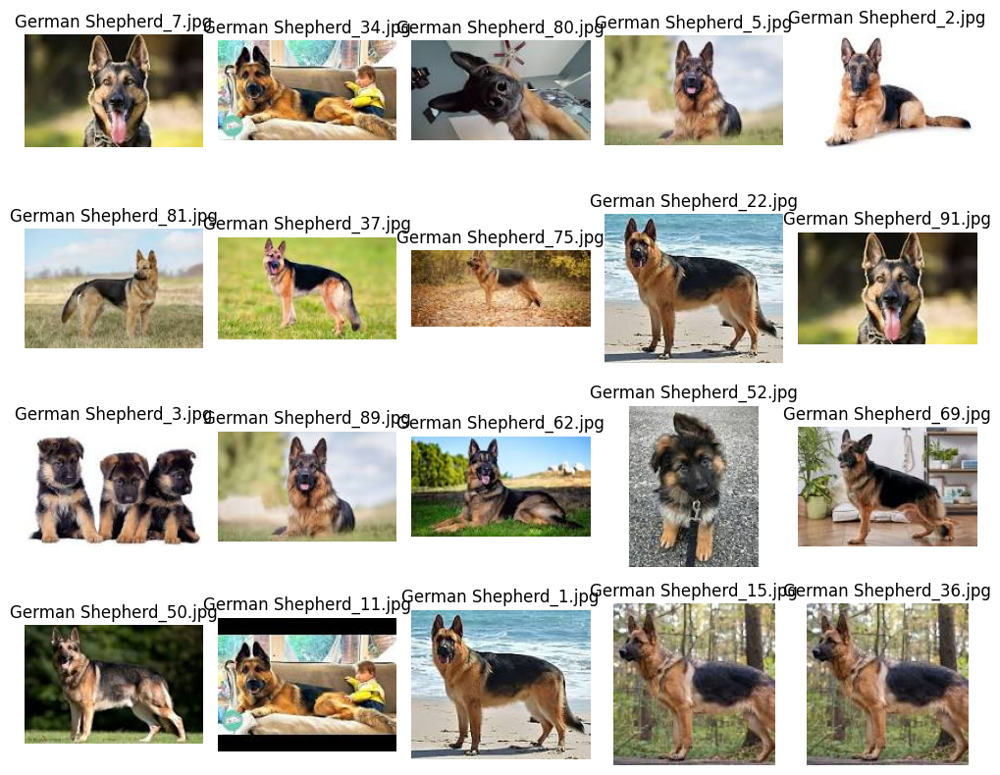

In [21]:
visualize_samples_by_label(train_df, 'German_Shepherd', num_samples=20)

Karakteristik German Shepherd:

- Tubuh yang besar
- Bulu berwarna campuran hitam dan coklat
- kuping besar dan naik

### 4.6 Golden Retriever

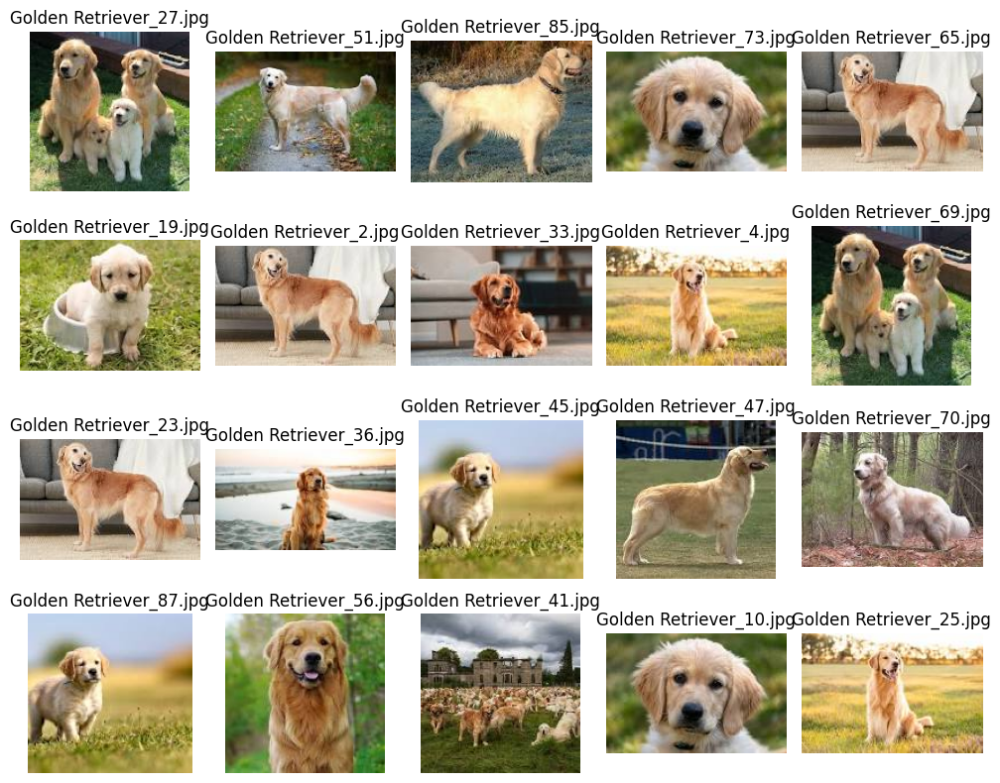

In [26]:
visualize_samples_by_label(train_df, 'Golden_Retriever', num_samples=20)

Karakterisrik Golden Retriever :
- Variasi bulu berwarna putih dan cokelat
- tubuh besar 
- kuping besar dan turun

### 4.7 Labrador Retriever

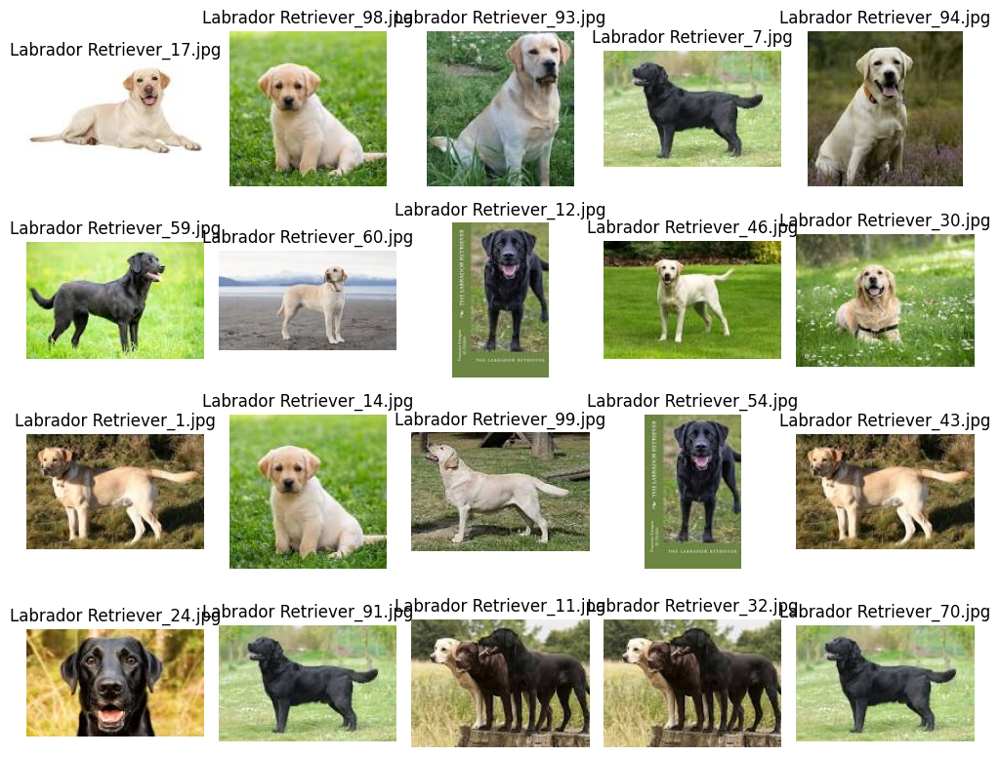

In [27]:
visualize_samples_by_label(train_df, 'Labrador_Retriever', num_samples=20)

Karakteristik Labrador Retriever :
- Variasi warna bulu putih, hitam, dan cokelat
- tubuh besar
- kubing besar dan turun

### 4.8 Poodle

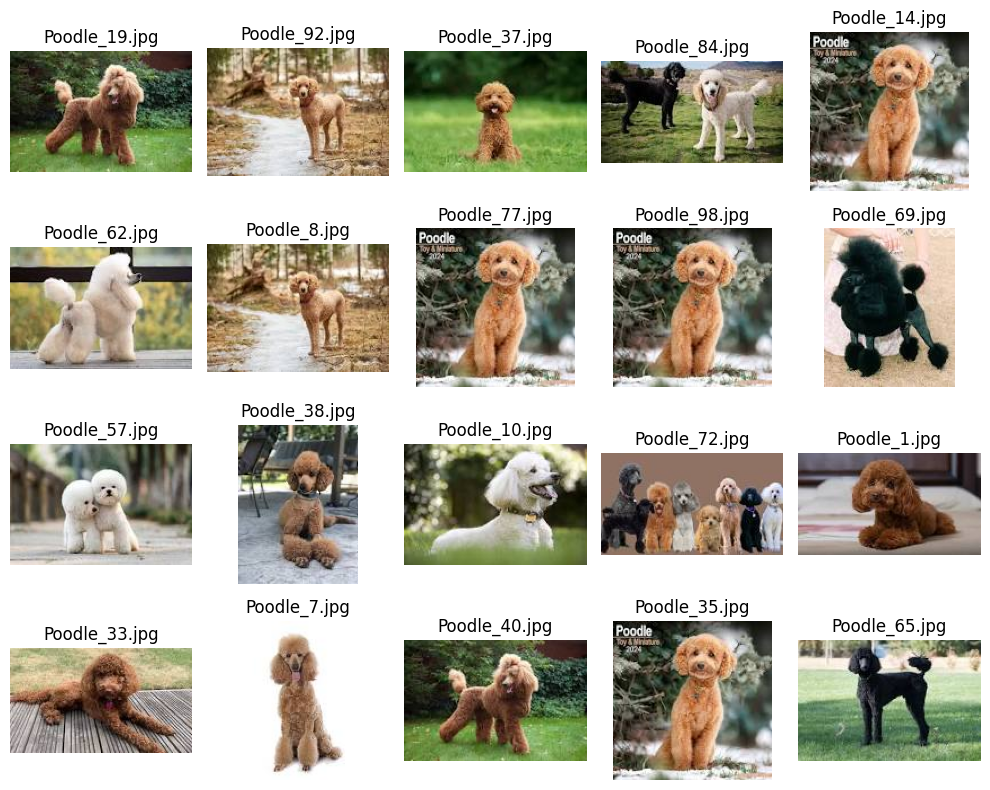

In [28]:
visualize_samples_by_label(train_df, 'Poodle', num_samples=20)

Karakteristik Poodle :
- tubuh kecil 
- variasi warna bulu banyak, dan bulu keriting
- kuping turun

### 4.9 Rottweiler

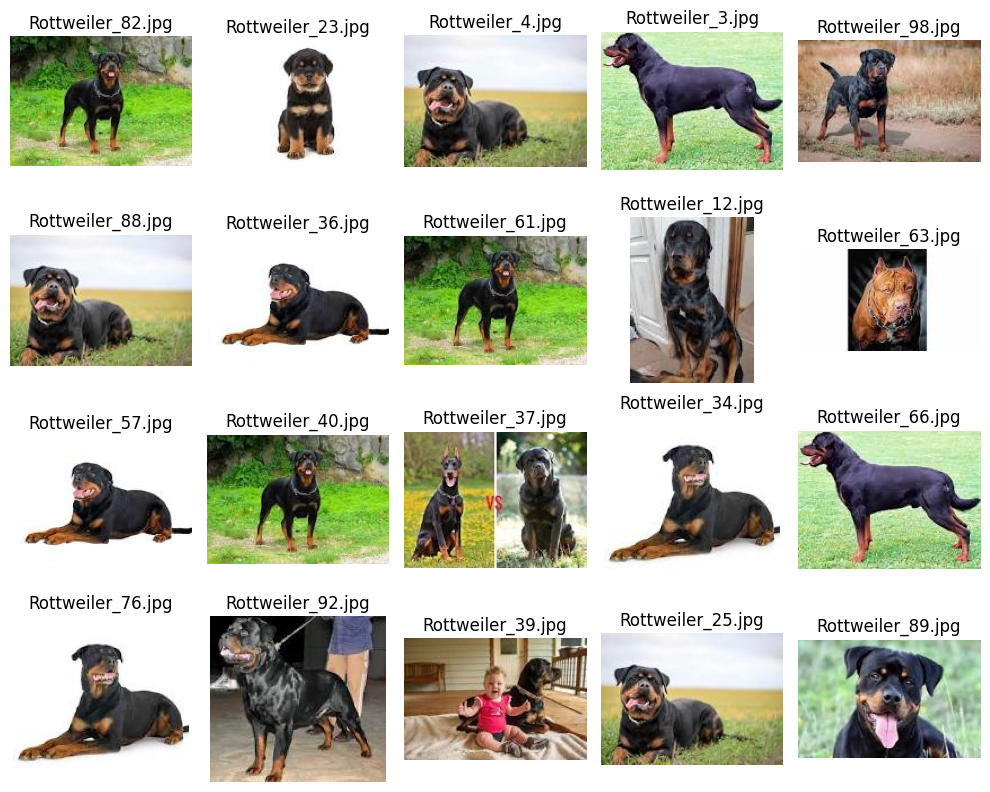

In [29]:
visualize_samples_by_label(train_df, 'Rottweiler', num_samples=20)

Karakteristik Rottweiler :
- warna bulu variasi hitam dan cokelat
- tubuh berotot dan besar
- kuping kecil dan naik

### 4.10 Yorkshire Terrier

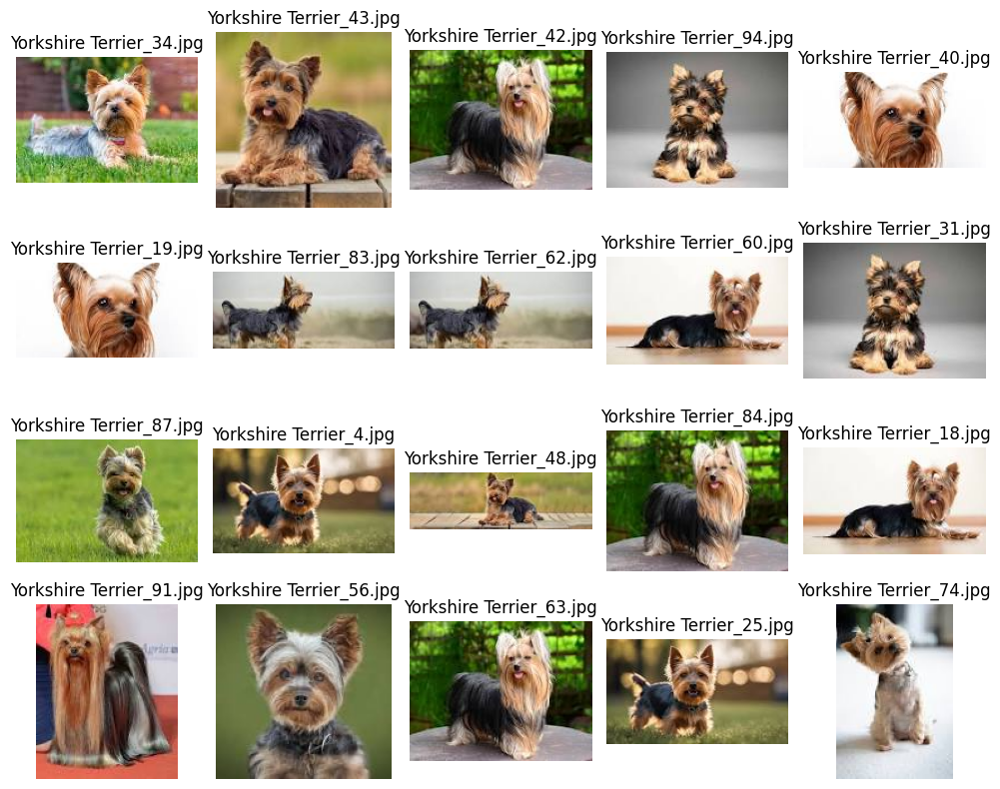

In [30]:
visualize_samples_by_label(train_df, 'Yorkshire_Terrier', num_samples=20)

Karakteristik Yorkshire Terrier :
- Tubuh kecil
- Kuping kecil dan naik
- Warna bulu variasi dari cokelat dan hitam

# 5. Feature Engineering

### 5.1 Split feature (x) and Target (y)



In [31]:
# feature
X = 'images'
# target
y = 'label'

## 5.2 Split train, test, and val data

Saya sudah memisah kan data menjadi train-set, test-set, dan validation-set di bagian data loading. Membagi nya menjadi 70% data train-set, 15% data test-set, dan 15% data validation set.

In [32]:
# cek data shape
print('Size train: ', train_df.shape)
print('Size validation: ', val_df.shape)
print('Size test: ', test_df.shape)


Size train:  (675, 2)
Size validation:  (143, 2)
Size test:  (149, 2)


## 5.3 Augmentation

Saya menggunakan augmentasi untuk menambah variasi data

In [33]:
# set setting
img_height=110 # set hight image
img_width=110  # set width image
seed=20
batch_size= 32
input=[img_height,img_width,3]

Menggunakan augmentasi `rescale`, `rotation_range`, `width_shift_range`, `shear_range`,`zoom_range`, `horizontal_flip`, dan `vertical_flip` untuk data train-set

In [34]:
# Membuat objek ImageDataGenerator untuk augmentasi data
train_datagen = ImageDataGenerator(
    rescale=1./255,          # Menskalakan nilai piksel gambar ke rentang 0 hingga 1 dengan membaginya dengan 255.
    rotation_range=0.1,      # Rotasi diterapkan pada gambar dalam rentang 0.1 radian.
    width_shift_range=0.2,   # Perpindahan horizontal dapat diterapkan pada gambar dalam rentang 20% dari total lebar.
    shear_range=0.2,         # Transformasi geser dapat diterapkan pada gambar dalam rentang 20%.
    zoom_range=0.2,          # Zooming dapat diterapkan pada gambar dalam rentang 20%. Bisa memperbesar atau memperkecil objek dalam gambar.
    horizontal_flip=True,    # Pembalikan horizontal dapat diterapkan pada gambar dengan kemungkinan 50%. Ini mencerminkan gambar secara horizontal.
    vertical_flip=True       # Pembalikan vertikal dapat diterapkan pada gambar dengan kemungkinan 50%. Ini mencerminkan gambar secara vertikal.
)


Untuk test-set dan validation-set, saya hanya akan menggunakan `rescale`

In [35]:
# validation-set rescale
val_datagen = ImageDataGenerator(rescale=1./255)

In [36]:
# test-set rescale
test_datagen = ImageDataGenerator(rescale=1./255)

Setelah ini saya akan melanjutkan proses augmentasi saya menggunakan flow_flow_dataframe untuk memproses proses augmentasi ke data saya. Menggunakan flow_flow_dataframe, saya dapat dengan mudah melakukan proses augmentasi data secara langsung saat memuatnya

In [37]:
# train data
ds_train = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=False,
    seed=seed)

# validation data
ds_val = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=False,
    seed=seed)

# test data
ds_test = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=False,
    seed=seed)


Found 675 validated image filenames belonging to 10 classes.
Found 143 validated image filenames belonging to 10 classes.
Found 149 validated image filenames belonging to 10 classes.


In [38]:
# check class
ds_train.class_indices

{'Beagle': 0,
 'Boxer': 1,
 'Bulldog': 2,
 'Dachshund': 3,
 'German_Shepherd': 4,
 'Golden_Retriever': 5,
 'Labrador_Retriever': 6,
 'Poodle': 7,
 'Rottweiler': 8,
 'Yorkshire_Terrier': 9}

# 6. ANN Training (Sequential API/Functional API)

### 6.1 Model Definition

Membuat callbacks

In [39]:
# membuat callbacks
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
callbacks = [
    EarlyStopping(monitor='val_loss', patience = 3),
    ModelCheckpoint('model.hdf5', monitor='val_loss', save_best_only=True)
]

- EarlyStopping akan menghentikan pelatihan jika kerugian validasi tidak membaik selama 3 epoch berturut-turut.
- ModelCheckpoint akan menyimpan model ke model.hdf5 hanya ketika kerugian validasi membaik. Model terbaik disimpan secara otomatis.

In [40]:
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
# Model Arsitecture
model= Sequential()

#Layer Conv 1,
model.add(Conv2D(filters=16, kernel_size=3, activation='relu',
                       input_shape=input))
model.add(MaxPooling2D(pool_size=2, strides=2))

#Layer Conv 2
model.add(Conv2D(filters=32, kernel_size=3, activation='relu', padding= 'same'))
model.add(MaxPooling2D(pool_size=2, strides=2))

#Flatten
model.add(Flatten())

#Hidden Layer
model.add(Dense(units=32, activation='relu'))

#Output Layer
model.add(Dense(units=15, activation='softmax'))

#Summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 108, 108, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 54, 54, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 54, 54, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 27, 27, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 23328)             0         
                                                                 
 dense (Dense)               (None, 32)                7

In [41]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

### 6.2 Model Training

In [42]:
# Training Based Model
%%time
history= model.fit(ds_train, batch_size= batch_size,
                           epochs= 100, validation_data= ds_val,
                           callbacks= callbacks)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


22/22 [==============================] - 10s 373ms/step - loss: 2.6378 - accuracy: 0.0815 - val_loss: 2.5295 - val_accuracy: 0.1538


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 2/100
22/22 [==============================] - 12s 529ms/step - loss: 2.4894 - accuracy: 0.1170 - val_loss: 2.4780 - val_accuracy: 0.1329
Epoch 3/100
22/22 [==============================] - 9s 408ms/step - loss: 2.3776 - accuracy: 0.1407 - val_loss: 2.2798 - val_accuracy: 0.2028
Epoch 4/100
22/22 [==============================] - 12s 570ms/step - loss: 2.2237 - accuracy: 0.1748 - val_loss: 2.1744 - val_accuracy: 0.1399
Epoch 5/100
22/22 [==============================] - 9s 417ms/step - loss: 2.1305 - accuracy: 0.2281 - val_loss: 2.0703 - val_accuracy: 0.2517
Epoch 6/100
22/22 [==============================] - 7s 330ms/step - loss: 2.0593 - accuracy: 0.2593 - val_loss: 2.0370 - val_accuracy: 0.2867
Epoch 7/100
22/22 [==============================] - 9s 417ms/step - loss: 2.0152 - accuracy: 0.2696 - val_loss: 1.9257 - val_accuracy: 0.2867
Epoch 8/100
22/22 [==============================] - 8s 378ms/step - loss: 1.9720 - accuracy: 0.2711 - val_loss: 1.9594 - val_accuracy: 0.30

### 6.4 Model Evaluation

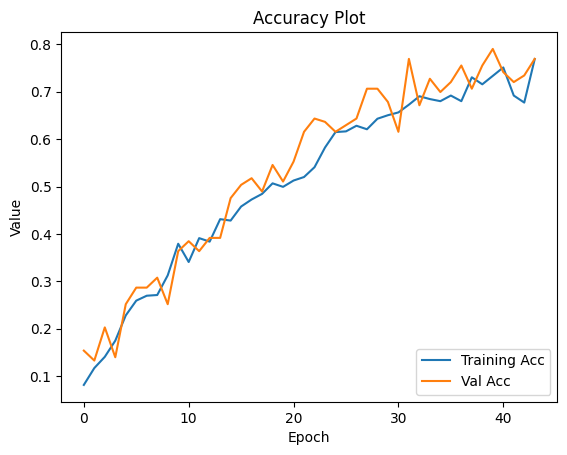

In [43]:
# plot result Based Model

plt.plot(history.history['accuracy'], label='Training Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

- model generalisasi dengan baik dan tidak overfitting data train-set.


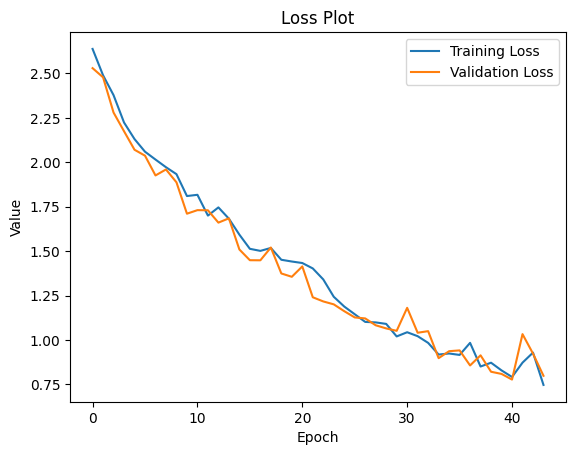

In [44]:
#loss train & validation
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc="upper right")
plt.show()


- model generalisasi dengan baik dan tidak overfitting data train-set.

Saya akan melihat hasil model memprediksi dataset test-set

In [45]:
# Predict test data
prediction = model.predict(ds_test)

5/5 [==============================] - 1s 63ms/step


In [46]:
ds_test.class_indices

{'Beagle': 0,
 'Boxer': 1,
 'Bulldog': 2,
 'Dachshund': 3,
 'German_Shepherd': 4,
 'Golden_Retriever': 5,
 'Labrador_Retriever': 6,
 'Poodle': 7,
 'Rottweiler': 8,
 'Yorkshire_Terrier': 9}

In [47]:
y_pred = np.argmax(model.predict(ds_test), axis=-1)
y_pred

5/5 [==============================] - 0s 76ms/step


array([9, 5, 9, 4, 7, 2, 3, 6, 3, 3, 5, 9, 2, 7, 1, 4, 7, 8, 3, 2, 5, 8,
       6, 7, 8, 9, 6, 9, 8, 9, 8, 5, 0, 9, 4, 3, 2, 1, 1, 6, 8, 5, 8, 7,
       6, 8, 3, 3, 7, 1, 3, 2, 7, 0, 6, 5, 4, 3, 1, 1, 2, 5, 1, 6, 3, 1,
       8, 1, 1, 8, 9, 9, 2, 3, 3, 9, 6, 1, 1, 1, 9, 9, 3, 2, 2, 5, 7, 1,
       8, 7, 6, 1, 6, 0, 8, 7, 9, 0, 9, 4, 9, 8, 6, 2, 1, 8, 1, 3, 5, 9,
       9, 6, 5, 1, 9, 0, 2, 5, 6, 9, 2, 3, 4, 7, 3, 8, 1, 7, 4, 9, 1, 1,
       3, 5, 1, 9, 8, 4, 9, 1, 0, 5, 4, 1, 9, 6, 6, 4, 1])

In [48]:
# create class name
class_names = ["Beagle", "Boxer", "Bulldog", "Dachshund", 'German_Shepherd', "Golden_Retriever", "Labrador_Retriever", "Poodle", "Rottweiler", "Yorkshire_Terrier"]

In [49]:
class_names

['Beagle',
 'Boxer',
 'Bulldog',
 'Dachshund',
 'German_Shepherd',
 'Golden_Retriever',
 'Labrador_Retriever',
 'Poodle',
 'Rottweiler',
 'Yorkshire_Terrier']

In [50]:
# change number to string in class
y_pred1=np.array(class_names)[y_pred]

In [51]:
y_pred1

array(['Yorkshire_Terrier', 'Golden_Retriever', 'Yorkshire_Terrier',
       'German_Shepherd', 'Poodle', 'Bulldog', 'Dachshund',
       'Labrador_Retriever', 'Dachshund', 'Dachshund', 'Golden_Retriever',
       'Yorkshire_Terrier', 'Bulldog', 'Poodle', 'Boxer',
       'German_Shepherd', 'Poodle', 'Rottweiler', 'Dachshund', 'Bulldog',
       'Golden_Retriever', 'Rottweiler', 'Labrador_Retriever', 'Poodle',
       'Rottweiler', 'Yorkshire_Terrier', 'Labrador_Retriever',
       'Yorkshire_Terrier', 'Rottweiler', 'Yorkshire_Terrier',
       'Rottweiler', 'Golden_Retriever', 'Beagle', 'Yorkshire_Terrier',
       'German_Shepherd', 'Dachshund', 'Bulldog', 'Boxer', 'Boxer',
       'Labrador_Retriever', 'Rottweiler', 'Golden_Retriever',
       'Rottweiler', 'Poodle', 'Labrador_Retriever', 'Rottweiler',
       'Dachshund', 'Dachshund', 'Poodle', 'Boxer', 'Dachshund',
       'Bulldog', 'Poodle', 'Beagle', 'Labrador_Retriever',
       'Golden_Retriever', 'German_Shepherd', 'Dachshund', 'Boxer',
 

In [52]:
# create dataframe to save prediction
pred_result_pred = pd.DataFrame(y_pred1, columns=['y_pred'])

In [53]:
pred_result_pred

,y_pred
0,Yorkshire_Terrier
1,Golden_Retriever
2,Yorkshire_Terrier
3,German_Shepherd
4,Poodle
...,...
144,Yorkshire_Terrier
145,Labrador_Retriever
146,Labrador_Retriever
147,German_Shepherd


In [54]:
# reset index
test_df_reset = test_df.reset_index(drop=True)
test_df_reset

,images,label
0,/content/Val/test/Yorkshire_Terrier/Yorkshire ...,Yorkshire_Terrier
1,/content/Val/test/Golden_Retriever/Golden Retr...,Golden_Retriever
2,/content/Val/test/Bulldog/Bulldog_75.jpg,Bulldog
3,/content/Val/test/German_Shepherd/German Sheph...,German_Shepherd
4,/content/Val/test/Poodle/Poodle_32.jpg,Poodle
...,...,...
144,/content/Val/test/Yorkshire_Terrier/Yorkshire ...,Yorkshire_Terrier
145,/content/Val/test/Labrador_Retriever/Labrador ...,Labrador_Retriever
146,/content/Val/test/Labrador_Retriever/Labrador ...,Labrador_Retriever
147,/content/Val/test/German_Shepherd/German Sheph...,German_Shepherd


In [55]:
# concat label and y_pred
result_model_pred1 = pd.concat([test_df_reset, pred_result_pred], axis=1)
result_model_pred1 = result_model_pred1.reset_index(drop=True)
result_model_pred1[['label', 'y_pred']]

,label,y_pred
0,Yorkshire_Terrier,Yorkshire_Terrier
1,Golden_Retriever,Golden_Retriever
2,Bulldog,Yorkshire_Terrier
3,German_Shepherd,German_Shepherd
4,Poodle,Poodle
...,...,...
144,Yorkshire_Terrier,Yorkshire_Terrier
145,Labrador_Retriever,Labrador_Retriever
146,Labrador_Retriever,Labrador_Retriever
147,German_Shepherd,German_Shepherd


In [56]:
print('Model classification report test : \n',classification_report(result_model_pred1['label'], result_model_pred1['y_pred']))

Best Model classification report test : 
                     precision    recall  f1-score   support

            Beagle       0.67      0.27      0.38        15
             Boxer       0.56      0.93      0.70        15
           Bulldog       0.92      0.73      0.81        15
         Dachshund       0.71      0.80      0.75        15
   German_Shepherd       1.00      0.67      0.80        15
  Golden_Retriever       1.00      0.87      0.93        15
Labrador_Retriever       0.87      0.87      0.87        15
            Poodle       0.92      0.73      0.81        15
        Rottweiler       0.88      1.00      0.93        14
 Yorkshire_Terrier       0.65      1.00      0.79        15

          accuracy                           0.79       149
         macro avg       0.82      0.79      0.78       149
      weighted avg       0.82      0.79      0.78       149



- Model memiliki accuracy yang cukup baik saat memprediksi test-set sebesar 79%


<Axes: >

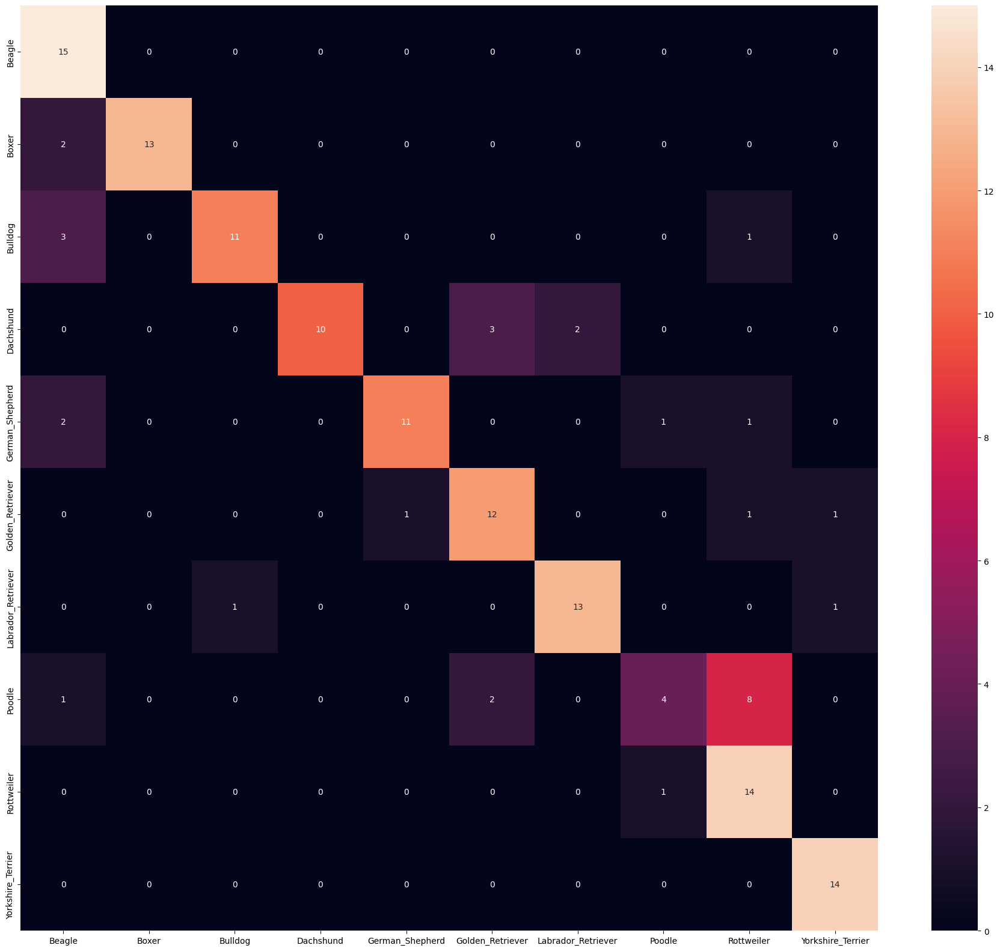

In [57]:
# Display Confussion Matrix
from sklearn.metrics import accuracy_score,classification_report,ConfusionMatrixDisplay,confusion_matrix
np.set_printoptions(suppress=True)

plt.figure(figsize=(23, 20))
model_confussionmatrix = confusion_matrix(result_model_pred1['label'], result_model_pred1['y_pred'], labels=result_model_pred1['label'].unique())
sns.heatmap(model_confussionmatrix, annot=True , xticklabels=class_names, yticklabels=class_names)

Model cukup good-fit untuk memproses data train-set dan test-set. Saya akan mencoba melakukan Model Improvement

# 7. ANN Improvement (Sequential API/Functional API)

### 7.1 Model Definition

Untuk mencoba melakukan model improvement, Saya mencoba menambahkan layer dan melakukan dropout.

In [58]:
modelimp = Sequential()
# Layer 1
modelimp.add(Conv2D(filters=128, kernel_size=3, activation='relu',
                       input_shape=input))
modelimp.add(MaxPooling2D(3,3))
# Layer 2
modelimp.add(Conv2D(64,kernel_size=(3,3), activation='relu'))
modelimp.add(MaxPooling2D(3,3))
# Layer 3
modelimp.add(Conv2D(32,kernel_size=(3,3), activation='relu'))
modelimp.add(MaxPooling2D(3,3))
# flatten
modelimp.add(Flatten())
modelimp.add(Dense(100,activation='relu'))
# dropout
modelimp.add(Dropout(0.3))
modelimp.add(Dense(len(class_names), activation='softmax'))
modelimp.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 108, 108, 128)     3584      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 36, 36, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 34, 34, 64)        73792     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 11, 11, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 9, 9, 32)          18464     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 3, 3, 32)         

In [59]:
modelimp.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 108, 108, 128)     3584      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 36, 36, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 34, 34, 64)        73792     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 11, 11, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 9, 9, 32)          18464     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 3, 3, 32)         

In [60]:
modelimp.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

### 7.2 Model Training

In [61]:
# Training Based Model
%%time
history1= modelimp.fit(ds_train, batch_size= batch_size,
                           epochs= 100, validation_data= ds_val,
                           callbacks= callbacks)

Epoch 1/100
22/22 [==============================] - 30s 1s/step - loss: 2.3171 - accuracy: 0.0859 - val_loss: 2.3004 - val_accuracy: 0.1119
Epoch 2/100
22/22 [==============================] - 37s 2s/step - loss: 2.3024 - accuracy: 0.0963 - val_loss: 2.2973 - val_accuracy: 0.1189
Epoch 3/100
22/22 [==============================] - 30s 1s/step - loss: 2.3016 - accuracy: 0.1215 - val_loss: 2.2884 - val_accuracy: 0.0839
Epoch 4/100
22/22 [==============================] - 29s 1s/step - loss: 2.2936 - accuracy: 0.1274 - val_loss: 2.2623 - val_accuracy: 0.1049
Epoch 5/100
22/22 [==============================] - 29s 1s/step - loss: 2.2660 - accuracy: 0.1289 - val_loss: 2.2207 - val_accuracy: 0.1538
Epoch 6/100
22/22 [==============================] - 29s 1s/step - loss: 2.1997 - accuracy: 0.1689 - val_loss: 2.1144 - val_accuracy: 0.1888
Epoch 7/100
22/22 [==============================] - 30s 1s/step - loss: 2.1602 - accuracy: 0.1822 - val_loss: 2.0650 - val_accuracy: 0.2308
Epoch 8/100
2

### 7.3 Model Evaluation

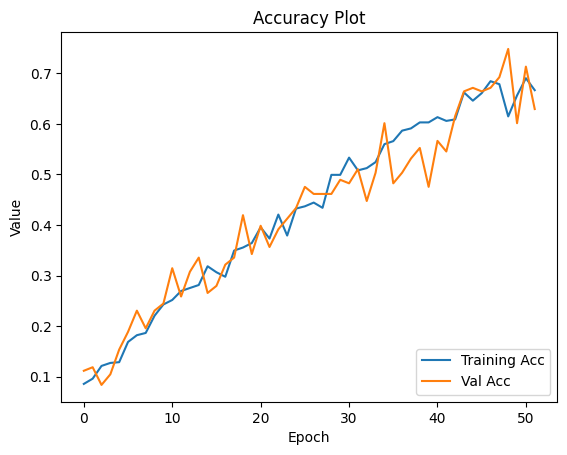

In [62]:

# plot resullt Imporvement Model
plt.plot(history1.history['accuracy'], label='Training Acc')
plt.plot(history1.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

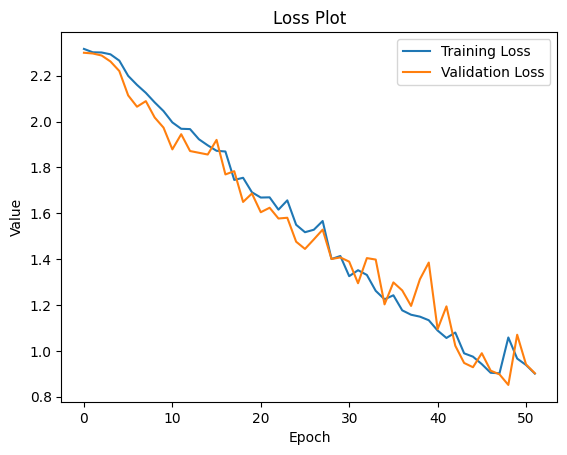

In [63]:
#loss train & validation
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Loss Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc="upper right")
plt.show()

Dari Model sebelum dan sesudah di improvement, Memang model yang sudah di improvement lebih good-fit, tetapi tingkat accuracy, dan waktu training lebih lama dari model yang sebelum di improve.

In [64]:

# predict using Transfer learning model
prediction2 = modelimp.predict(ds_test)

5/5 [==============================] - 1s 260ms/step


In [65]:
y_pred2 = np.argmax(modelimp.predict(ds_test), axis=-1)
y_pred2

5/5 [==============================] - 1s 269ms/step


array([0, 5, 2, 4, 7, 2, 3, 6, 0, 3, 5, 5, 2, 3, 1, 4, 7, 8, 1, 2, 5, 8,
       4, 3, 6, 1, 6, 5, 6, 9, 6, 2, 2, 9, 1, 3, 2, 0, 1, 6, 8, 2, 8, 5,
       2, 1, 4, 4, 3, 1, 0, 2, 7, 0, 3, 6, 4, 3, 1, 0, 2, 6, 7, 6, 1, 1,
       8, 1, 0, 7, 7, 1, 1, 3, 9, 9, 2, 1, 3, 0, 9, 7, 3, 2, 0, 5, 7, 1,
       8, 7, 6, 1, 6, 0, 8, 7, 2, 0, 3, 3, 1, 8, 6, 2, 1, 7, 0, 3, 2, 9,
       9, 6, 5, 2, 9, 0, 2, 2, 6, 9, 2, 4, 4, 7, 1, 3, 1, 8, 4, 2, 1, 2,
       3, 5, 2, 9, 8, 4, 0, 2, 7, 5, 4, 1, 9, 6, 6, 4, 1])

In [66]:
test_df

,images,label
0,/content/Val/test/Yorkshire_Terrier/Yorkshire ...,Yorkshire_Terrier
1,/content/Val/test/Golden_Retriever/Golden Retr...,Golden_Retriever
2,/content/Val/test/Bulldog/Bulldog_75.jpg,Bulldog
3,/content/Val/test/German_Shepherd/German Sheph...,German_Shepherd
4,/content/Val/test/Poodle/Poodle_32.jpg,Poodle
...,...,...
144,/content/Val/test/Yorkshire_Terrier/Yorkshire ...,Yorkshire_Terrier
145,/content/Val/test/Labrador_Retriever/Labrador ...,Labrador_Retriever
146,/content/Val/test/Labrador_Retriever/Labrador ...,Labrador_Retriever
147,/content/Val/test/German_Shepherd/German Sheph...,German_Shepherd


In [67]:
# change number to string in class
y_pred2=np.array(class_names)[y_pred2]

In [68]:
y_pred2

array(['Beagle', 'Golden_Retriever', 'Bulldog', 'German_Shepherd',
       'Poodle', 'Bulldog', 'Dachshund', 'Labrador_Retriever', 'Beagle',
       'Dachshund', 'Golden_Retriever', 'Golden_Retriever', 'Bulldog',
       'Dachshund', 'Boxer', 'German_Shepherd', 'Poodle', 'Rottweiler',
       'Boxer', 'Bulldog', 'Golden_Retriever', 'Rottweiler',
       'German_Shepherd', 'Dachshund', 'Labrador_Retriever', 'Boxer',
       'Labrador_Retriever', 'Golden_Retriever', 'Labrador_Retriever',
       'Yorkshire_Terrier', 'Labrador_Retriever', 'Bulldog', 'Bulldog',
       'Yorkshire_Terrier', 'Boxer', 'Dachshund', 'Bulldog', 'Beagle',
       'Boxer', 'Labrador_Retriever', 'Rottweiler', 'Bulldog',
       'Rottweiler', 'Golden_Retriever', 'Bulldog', 'Boxer',
       'German_Shepherd', 'German_Shepherd', 'Dachshund', 'Boxer',
       'Beagle', 'Bulldog', 'Poodle', 'Beagle', 'Dachshund',
       'Labrador_Retriever', 'German_Shepherd', 'Dachshund', 'Boxer',
       'Beagle', 'Bulldog', 'Labrador_Retriever', 

In [69]:

# create dataframe
pred_result_pred2 = pd.DataFrame(y_pred2, columns=['y_pred_improve'])
pred_result_pred2

,y_pred_improve
0,Beagle
1,Golden_Retriever
2,Bulldog
3,German_Shepherd
4,Poodle
...,...
144,Yorkshire_Terrier
145,Labrador_Retriever
146,Labrador_Retriever
147,German_Shepherd


In [70]:
# concat test data and result prediction
result_model_pred2 = pd.concat([test_df_reset, pred_result_pred2], axis=1)
result_model_pred2 = result_model_pred2.reset_index(drop=True)
result_model_pred2[['label', 'y_pred_improve']]

,label,y_pred_improve
0,Yorkshire_Terrier,Beagle
1,Golden_Retriever,Golden_Retriever
2,Bulldog,Bulldog
3,German_Shepherd,German_Shepherd
4,Poodle,Poodle
...,...,...
144,Yorkshire_Terrier,Yorkshire_Terrier
145,Labrador_Retriever,Labrador_Retriever
146,Labrador_Retriever,Labrador_Retriever
147,German_Shepherd,German_Shepherd


In [71]:
print('Best Model classification report test : \n',classification_report(result_model_pred2['label'], result_model_pred2['y_pred_improve']))


Best Model classification report test : 
                     precision    recall  f1-score   support

            Beagle       0.79      0.73      0.76        15
             Boxer       0.61      0.93      0.74        15
           Bulldog       0.58      0.93      0.72        15
         Dachshund       0.56      0.60      0.58        15
   German_Shepherd       1.00      0.80      0.89        15
  Golden_Retriever       0.90      0.60      0.72        15
Labrador_Retriever       0.69      0.73      0.71        15
            Poodle       0.85      0.73      0.79        15
        Rottweiler       0.90      0.64      0.75        14
 Yorkshire_Terrier       0.91      0.67      0.77        15

          accuracy                           0.74       149
         macro avg       0.78      0.74      0.74       149
      weighted avg       0.78      0.74      0.74       149



Model yang sudah di improve memiliki accuracy 74%, Model yang belum di improve memiliki nilai accuracy yang lebih baik, dan waktu proses training lebih cepat.

Saya akan menggunakan model yang sudah di improve karena lebih good-fit 

<Axes: >

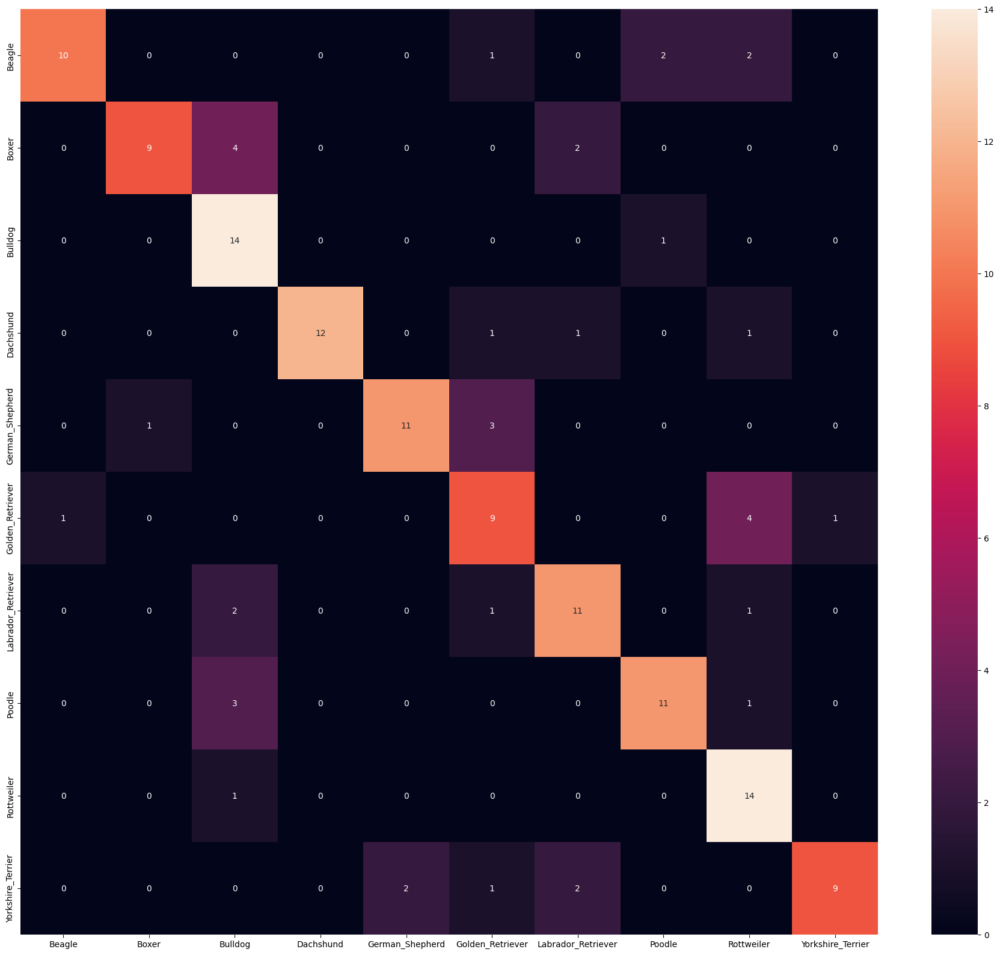

In [72]:
# Display Confussion Matrix

np.set_printoptions(suppress=True)

plt.figure(figsize=(23, 20))
model_confussionmatrix = confusion_matrix(result_model_pred2['label'], result_model_pred2['y_pred_improve'], labels=result_model_pred2['label'].unique())
sns.heatmap(model_confussionmatrix, annot=True , xticklabels=class_names, yticklabels=class_names)

Karena model yang sudah di improve, saya akan menggunakan model yang sudah di improve di proses inference dan deployment

Saya ingin mengetahui karakteristik apa, yang membuat model saya salah salah memprediksi dengan benar

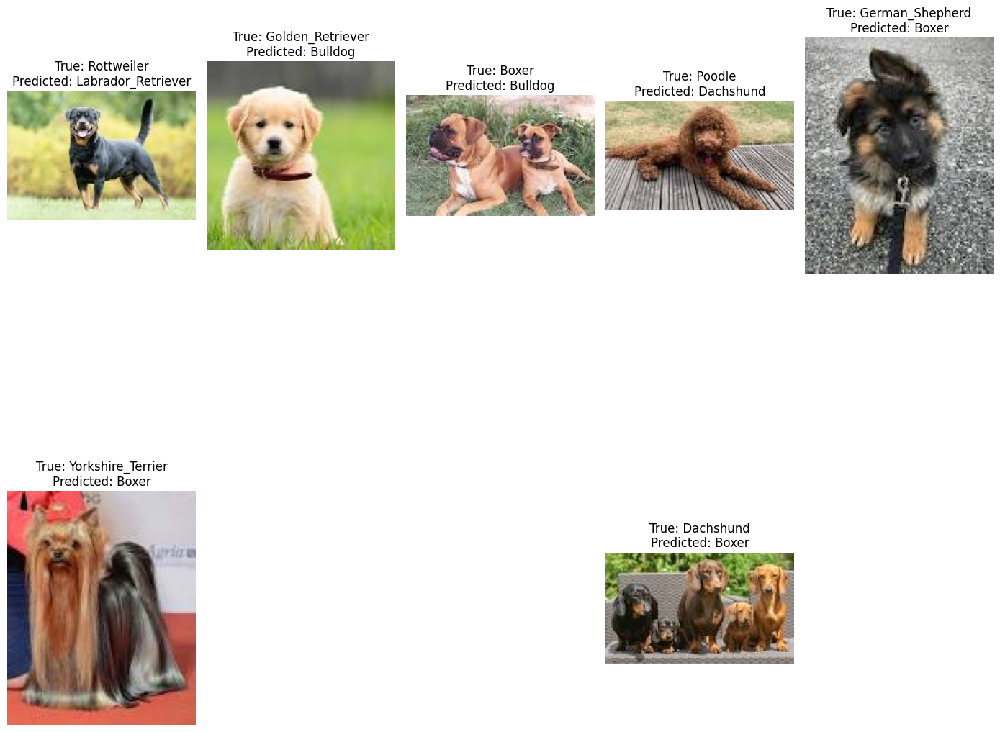

In [73]:
incorrect_predictions = result_model_pred2[result_model_pred1['label'] != result_model_pred1['y_pred']].head(10)

plt.figure(figsize=(14, 14))
for i, row in incorrect_predictions.iterrows():
    image_path = row[test_df.columns.get_loc('images')]
    true_label = row['label']
    predicted_label = row['y_pred_improve']

    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i % 10 + 1)
    plt.imshow(img)
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
    plt.axis('off')

plt.tight_layout()
plt.show()


Karakterisrik prediksi salah :
 - Ukuran: Model memprediksi beberapa anjing sebagai ras yang umumnya lebih besar daripada anjing yang sebenarnya ada dalam gambar. Contohnya, model memprediksi anjing Yorkshire Terrier sebagai Boxer, yang merupakan ras yang jauh lebih besar.
- Bentuk Tubuh: Model memprediksi beberapa anjing dengan bentuk tubuh yang berbeda dari anjing yang sebenarnya ada dalam gambar. Contohnya, model memprediksi anjing rottweiler sebagai labrador_retriever, yang memiliki bentuk tubuh yang lebih besar dan berotot.
- Ciri Khas Ras: Model tidak mengenali beberapa ciri khas ras yang ada pada anjing dalam gambar. Contohnya, model tidak mengenali bulu panjang dan halus pada anjing Yorkshire Terrier, atau bulu tebal dan keriting pada anjing poodle.

# 8. Model Saving

In [75]:
# Saving model
modelimp.save("model1.h5")

# 9. Conclusion

### Further Improvements
Karena waktu yang sangat singkat, saya belum menemukan arsitektur model yang bisa memiliki accuracy diatas 80 %.
Untuk kedepanya bisa mencoba metode lain untuk mengimprove model, contohnya bisa mencoba untuk merubah arsitektur model, dan mecari yang terbaik. Bisa juga mencoba mencari transferlearing

### Kelebihan dan Kekurangan Model :

Kelebihan :
 - Model Sudah cukup mampu memprediksi data baru, dengan tingkat accuracy sebesar 74%
 - ada 10 kelas ras anjing yang bisa di prediksi

Kekurangan :
 - Model masih kurang dalah memprediksi ukuran, bentuk tubuh, dan ciri khas ras. Model masih ada salah.

### Kesimpulan 

Model dibuat menggunakan CNN, dan metrik evaluasi accuracy. Model sudah cukup mampu untuk menebak data baru(test-set)
dengan accuracy 74%. Model cukup bisa diandalkan untuk membantu dalam berbagai aplikasi, termasuk adopsi hewan peliharaan, manajemen data hewan, dan bahkan penelitian genetik.


